In [2]:
%load_ext autoreload
%autoreload 2

## Basic setup

In [3]:
import Concord as ccd
import scanpy as sc
import torch
import warnings
from pathlib import Path
warnings.filterwarnings('ignore')

data_dir = Path('../data/Shichen_immune/')

In [ ]:

# data_path = data_dir / "adata_filtered.h5ad"
# adata = sc.read(
#     data_path
# )

# adata.layers["counts"] = adata.X.copy()
# sc.pp.normalize_total(adata)
# sc.pp.log1p(adata)
# ccd.ul.score_cell_cycle(adata, organism='Hs')

In [4]:
adata = sc.read(data_dir / 'adata_Nov21-1754.h5ad')

In [5]:
import time
from pathlib import Path
proj_name = "concord_Shichen_immune"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
file_suffix = f"{time.strftime('%b%d-%H%M')}"
seed = 0

In [6]:
file_suffix

'Nov21-2101'

## PCA->UMAP

In [15]:
import scanpy as sc
adata_sc = adata.copy()
sc.pp.highly_variable_genes(adata_sc, n_top_genes=10000)  # Identify highly variable genes
sc.tl.pca(adata, svd_solver="arpack")
sc.pp.neighbors(adata_sc, n_neighbors=30)  
sc.tl.umap(adata_sc, min_dist=0.1)
adata.obsm = adata_sc.obsm 

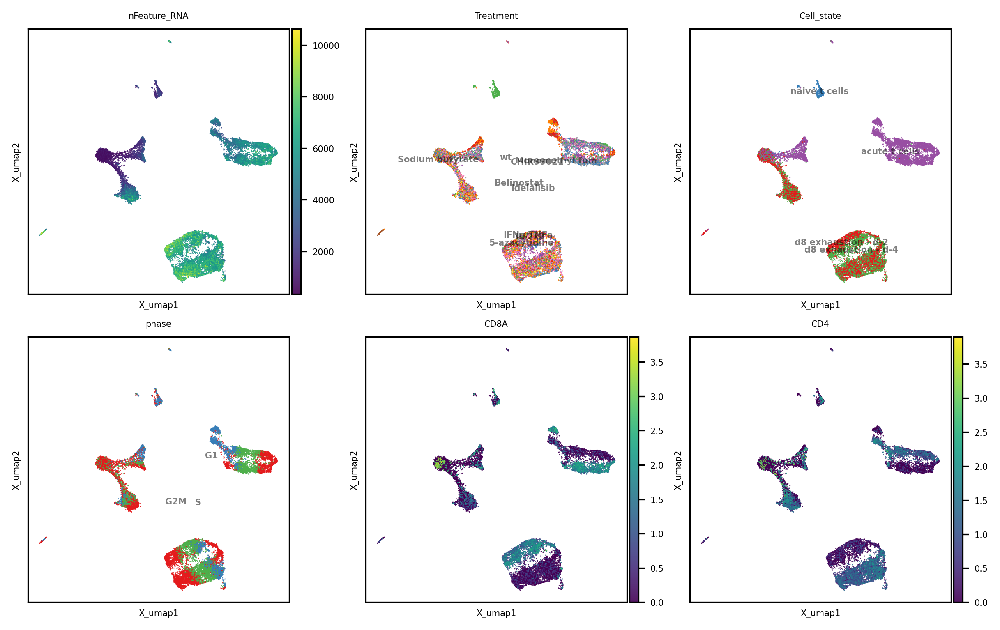

In [49]:
show_basis = 'X_umap'
show_cols = ['nFeature_RNA', 'Treatment', 'Cell_state',	'phase', 'CD8A', 'CD4']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,5), dpi=300, ncols=3, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

## Run Concord

In [18]:
file_suffix

'concord_Shichen_immune_Nov21'

AxisArrays with keys: X_pca, X_umap, Concord_Nov21-1457, Concord_Nov21-1457_UMAP, Concord_Nov21-1457_UMAP_3D, Concord_Nov21-1617, Concord_Nov21-1617_UMAP, Concord_Nov21-1623, Concord_Nov21-1623_UMAP, Concord_Nov21-1628, Concord_Nov21-1628_UMAP, Concord_Nov21-1631, Concord_Nov21-1631_UMAP, Concord_Nov21-1631_UMAP_3D, Concord_Nov21-1742, Concord_Nov21-1742_UMAP, Concord_Nov21-1742_UMAP_3D, Concord_Nov21-1754, Concord_Nov21-1754_UMAP, Concord_Nov21-1754_UMAP_3D

In [55]:
file_suffix = f"{time.strftime('%b%d-%H%M')}"
output_key = f'Concord_{file_suffix}'
feature_list = ccd.ul.select_features(adata, n_top_features=10000, flavor='seurat_v3')
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=feature_list, 
                      domain_key=None, 
                      latent_dim=64,
                      n_epochs=20,
                      augmentation_mask_prob = 0.5, 
                      clr_temperature = .5, # Check out advanced usage to learn what this parameter controls
                      use_decoder=False,
                      seed=seed, 
                      inplace=False, 
                      verbose=False, 
                      device=device,
                      save_dir=save_dir) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

# Save the latent embedding to a filem, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")
adata.obsm = cur_ccd.adata.obsm # If not inplace

Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
Concord.model.dataloader - WARNING - Only one domain found in the data. Setting p_intra_domain to 1.0.
p_intra_knn: 0.3


Epoch 0 Training: 264it [00:04, 55.97it/s, loss=3.59]
Epoch 19 Training: 100%|██████████| 264/264 [00:04<00:00, 58.67it/s, loss=3.4] 


## Visualize Concord latent with UMAP

In [ ]:
basis= output_key
ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)

In [12]:
output_key = 'Concord_Nov21-1754'
# leiden clustering
sc.pp.neighbors(adata, n_neighbors=30, use_rep=output_key)
sc.tl.leiden(adata, resolution=1.0, key_added='leiden')

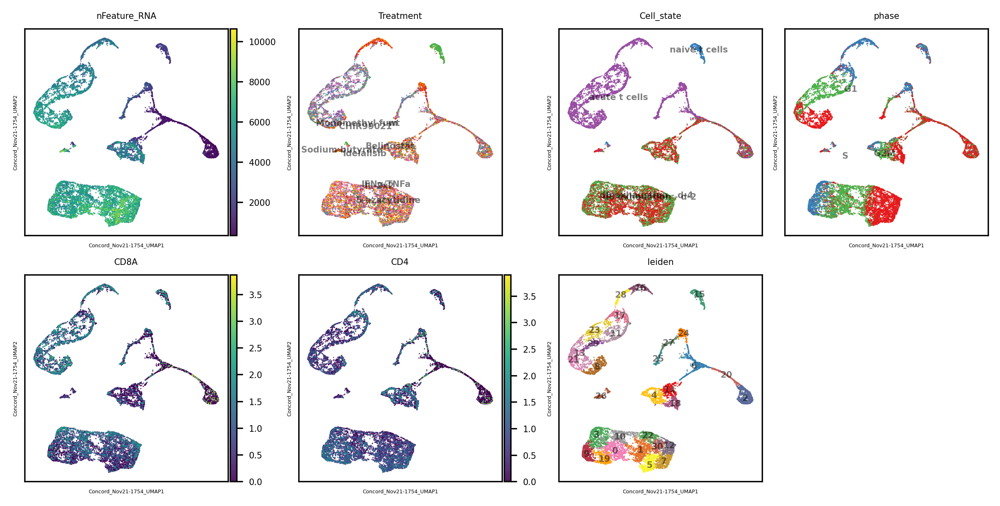

In [13]:
basis= output_key
show_basis = basis + '_UMAP'
show_cols = ['nFeature_RNA', 'Treatment', 'Cell_state',	'phase', 'CD8A', 'CD4', 'leiden']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,4), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

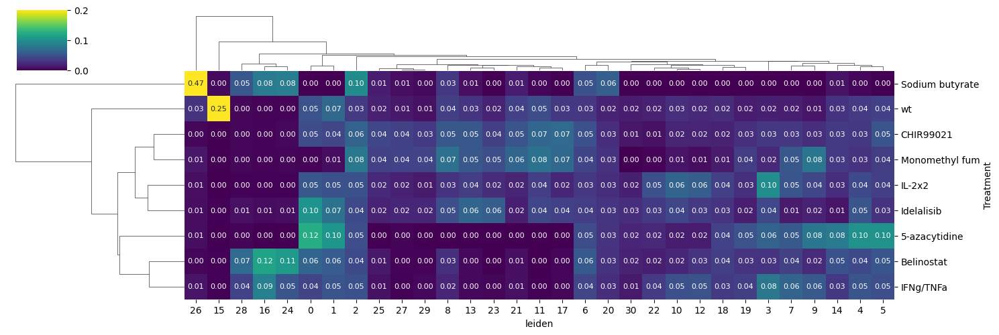

In [14]:
# Quantify treatment distribution over leiden, and plot as heatmap
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
treatment_fraction = pd.crosstab(adata.obs['Treatment'], adata.obs['leiden'], normalize='index')

sns.clustermap(
            treatment_fraction,
            cmap='viridis',
            #vmin=vmin,
            vmax=0.2,
            annot=True,
            fmt='.2f',
             annot_kws={"size": 8},
            row_cluster=True,
            col_cluster=True,
            yticklabels=True,
            xticklabels=True,
            figsize=(15, 5),
        )
plt.savefig(save_dir / f"{show_basis}_treatment_fraction_{file_suffix}.png", dpi=300)

In [64]:
# rowsum treatment_fraction
treatment_fraction.sum(axis=1)

Treatment
5-azacytidine      1.0
Belinostat         1.0
CHIR99021          1.0
IFNg/TNFa          1.0
IL-2x2             1.0
Idelalisib         1.0
Monomethyl fum     1.0
Sodium butyrate    1.0
wt                 1.0
dtype: float64

In [13]:
def make_valid_filename(filename):
    import re
    # Replace invalid characters
    return re.sub(r'[\/:*?"<>|]', '_', filename)


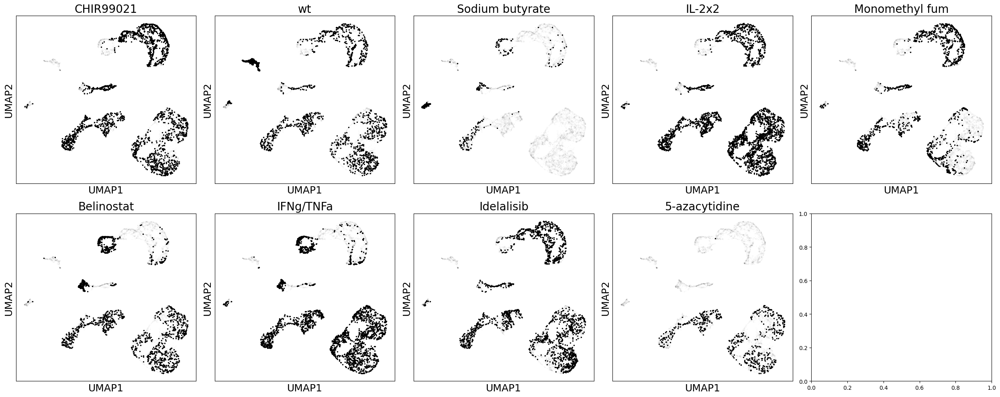

In [ ]:
# Highlight each Treatment conditions
import matplotlib.pyplot as plt
#show_cols = ['Cell_state']
show_cols = [None]
treatment = adata.obs['Treatment'].unique()[0]
n_cols = 5
nrows = len(adata.obs['Treatment'].unique()) // n_cols + 1
fig, axs = plt.subplots(nrows, n_cols, figsize=(5*n_cols, 5*nrows))
axs = axs.flatten()
for i, treatment in enumerate(adata.obs['Treatment'].unique()):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, 
        point_size=4, highlight_size=8,
        highlight_indices = adata.obs['Treatment'] == treatment,
        title = treatment, xlabel = 'UMAP1', ylabel = 'UMAP2',
        ax = axs[i],
        default_color='lightgrey', highlight_color='black',
        alpha = 0.01,
        figsize=(8,5), dpi=300, ncols=3, font_size=20, legend_loc=None,
        save_path=None, 
    )

plt.tight_layout()
plt.savefig(save_dir / f"{show_basis}_treatment_{show_cols[0]}_{file_suffix}.png", dpi=300)



In [ ]:
# Highlight each Treatment conditions
show_basis = 'Concord_Nov21-1754_UMAP'
show_cols = ['nFeature_RNA', 'Treatment', 'Cell_state',	'phase', 'CD8A', 'CD4']
for treatment in adata.obs['Treatment'].unique():
    ccd.pl.plot_embedding(
        adata[adata.obs['Treatment']==treatment], show_basis, show_cols, figsize=(8,5), dpi=300, ncols=3, font_size=5, point_size=2, legend_loc='on data',
        save_path=save_dir / f"{show_basis}_{make_valid_filename(treatment)}_{file_suffix}.png"
    )

In [57]:
ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)

In [58]:
show_basis = f'{basis}_UMAP_3D'
for col in show_cols:
    ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Assignment', 'Treatment', 'Cell_state', 'S_score', 'G2M_score', 'phase', 'DIM1', 'DIM2', 'DIM3'] but received: CD8A

In [69]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad")

In [31]:
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='hsa')

VisCello project created at ../data/Shichen_immune/cello_concord_Shichen_immune_Nov21-1457


In [66]:
data_dir / f"adata_{file_suffix}.h5ad"

PosixPath('../data/Shichen_immune/adata_Nov21-1754.h5ad')

In [65]:
adata.obsm

AxisArrays with keys: X_pca, X_umap, Concord_Nov21-1457, Concord_Nov21-1457_UMAP, Concord_Nov21-1457_UMAP_3D, Concord_Nov21-1617, Concord_Nov21-1617_UMAP, Concord_Nov21-1623, Concord_Nov21-1623_UMAP, Concord_Nov21-1628, Concord_Nov21-1628_UMAP, Concord_Nov21-1631, Concord_Nov21-1631_UMAP, Concord_Nov21-1631_UMAP_3D, Concord_Nov21-1742, Concord_Nov21-1742_UMAP, Concord_Nov21-1742_UMAP_3D, Concord_Nov21-1754, Concord_Nov21-1754_UMAP, Concord_Nov21-1754_UMAP_3D